this file shows both 2-d and 3-d embedding of various kg embedding based on NEKG

In [1]:
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO) 
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

In [2]:
import pandas as pd
import numpy as np

In [3]:
import tensorflow as tf

In [4]:
import ampligraph
from ampligraph.latent_features import TransE,RandomBaseline,DistMult,ComplEx,HolE,ConvE,ConvKB


In [5]:
# Knowledge Graph Construction.
def graph_construction(start, stop, step):
    kg = pd.DataFrame()
    kg['h'] = [i for i in np.arange(start, stop, step)]
    kg['r'] = ['isLessThan'] * int((stop-start) / step)
    kg['t'] = [i for i in np.arange(step, stop+1, step)]
    kg["h"] = kg.h.values.astype(str)
    kg["t"] = kg.t.values.astype(str)
    return kg

In [6]:
start = 0
stop = 1000
step = 1
kg_df = graph_construction(start, stop, step)
kg_df.head()

,h,r,t
0,0,isLessThan,1
1,1,isLessThan,2
2,2,isLessThan,3
3,3,isLessThan,4
4,4,isLessThan,5


In [10]:
def tsne_2d(model):
    embeddings = model.get_embeddings(entities=[str(j) for j in np.arange(start, stop+1, step)], embedding_type='entity')
    embeddings = np.asarray(embeddings, dtype='float64')
    embeddings_tSNE = TSNE(n_components=2).fit_transform(embeddings)
    embeddings_tSNE = pd.DataFrame(embeddings_tSNE, columns=['tSNE_1', 'tSNE_2'])
    embeddings_tSNE['magnitude'] = [i for i in range(start, stop+1, step)]
    return embeddings_tSNE

In [12]:
def plot_tsne_2d(embeddings_tSNE):
    plt.scatter(embeddings_tSNE.tSNE_1, embeddings_tSNE.tSNE_2,  c=embeddings_tSNE.magnitude, s=10)
    plt.title('2-D t-SNE Visualization of 200 Integers’ Embedding Vectors')
    plt.xlabel('tSNE_1')
    plt.ylabel('tSNE_2')
    plt.show()

In [17]:
# Measure the similarity between numbers--处理oov number
def cal_sim(x1, x2, x3):
    return (x2-x1)/(x3-x1)

In [16]:
def plot_tsne_3d(embeddings_tSNE):
    fig = plt.figure(figsize=(100,100))
    ax = fig.gca(projection='3d')
    x1=embeddings_tSNE.tSNE_1
    y1=embeddings_tSNE.tSNE_2
    z1=embeddings_tSNE.tSNE_3
    #ax.plot(x1, y1, z1)
    ax.scatter(x1, y1, z1, c=z1, marker='^',s=1000)
    plt.show()

In [22]:
def tsne_3d(model):
    embeddings = model.get_embeddings(entities=[str(j) for j in np.arange(start, stop+1, step)], embedding_type='entity')
    embeddings = np.asarray(embeddings, dtype='float64')
    embeddings_tSNE = TSNE(n_components=3).fit_transform(embeddings)
    embeddings_tSNE = pd.DataFrame(embeddings_tSNE, columns=['tSNE_1', 'tSNE_2', 'tSNE_3'])
    embeddings_tSNE['magnitude'] = [i for i in range(start, stop+1, step)]
    return embeddings_tSNE

In [51]:
# Obtain embedding vectors for OOVs.
def get_oov(model):
    OOVs = range(0, 1000)
    OOV_embeddings = []
    for i in OOVs:
        for j in np.arange(start, stop+1, step):
            if i < j:
                upper = j
                lower = j-step
                e1 = model.get_embeddings(str(lower), embedding_type='entity')
                e2 = model.get_embeddings(str(upper), embedding_type='entity')
                s2 = cal_sim(lower, i, upper)
                s1 = 1-s2            
                OOV_embeddings.append(e1 * s1 + e2 * s2)
                break
    OOV_embeddings = np.asarray(OOV_embeddings, dtype='float64')
    return OOV_embeddings

transe

In [42]:
##kg embedding-TransE
kg_array = kg_df.to_numpy().astype(str)
model = TransE(epochs=300, k=100, verbose=True)#,loss='self_adversarial'
model.fit(kg_array)

Average TransE Loss:   0.979671: 100%|██████████| 300/300 [00:21<00:00, 14.26epoch/s]


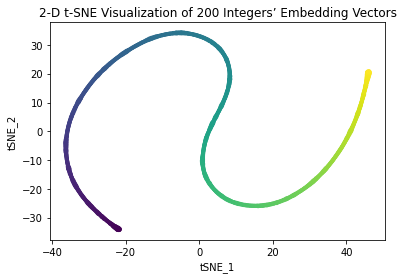

In [14]:
embeddings_tSNE=tsne_2d(model)
plot_tsne_2d(embeddings_tSNE)

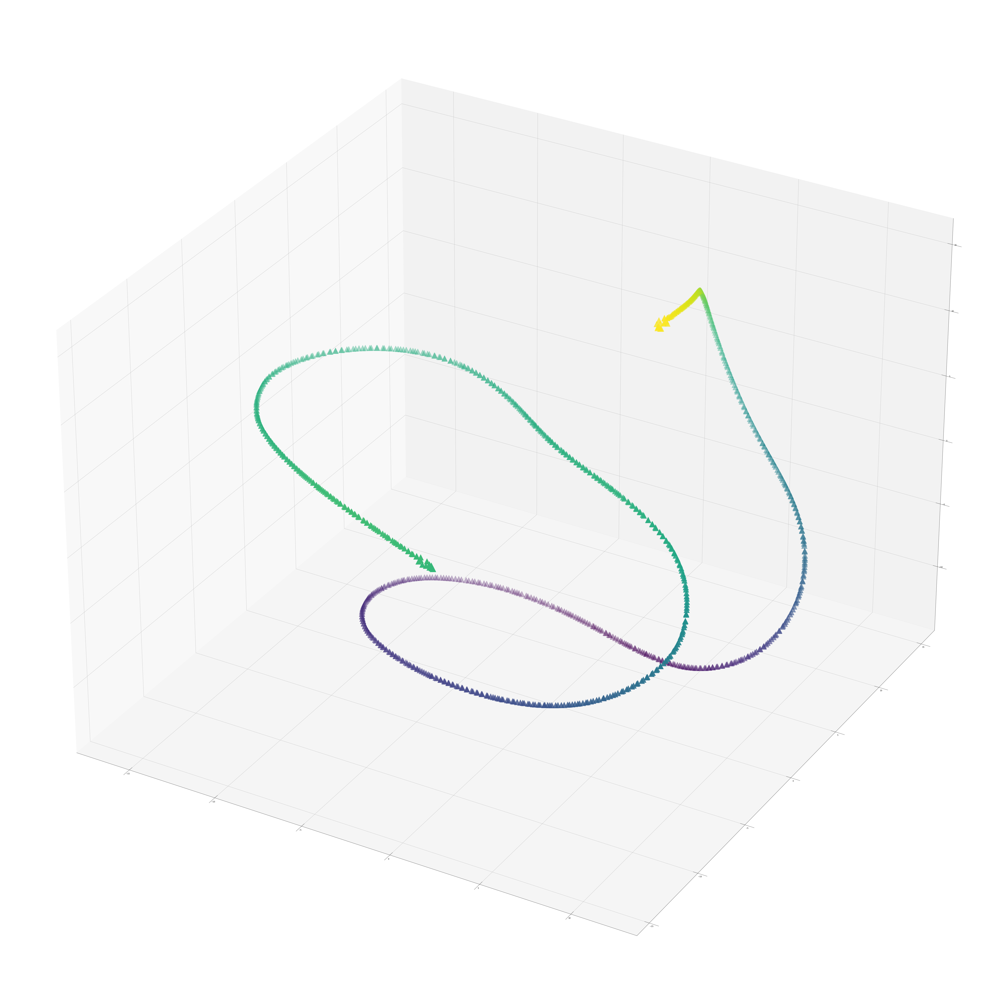

In [25]:
embeddings_tSNE=tsne_3d(model)
plot_tsne_3d(embeddings_tSNE)

In [52]:
OOV_embeddings=get_oov(model)
np.save("transe 0-999 100d.npy",OOV_embeddings)

DistMult

In [55]:
#-DistMult
kg_array = kg_df.to_numpy().astype(str)
model = DistMult(epochs=300, k=100, verbose=True)
model.fit(kg_array)

Average DistMult Loss:   0.019150: 100%|██████████| 300/300 [00:19<00:00, 15.47epoch/s]


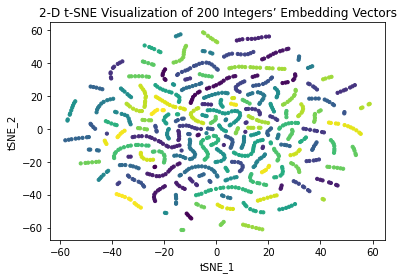

In [27]:
embeddings_tSNE=tsne_2d(model)
plot_tsne_2d(embeddings_tSNE)

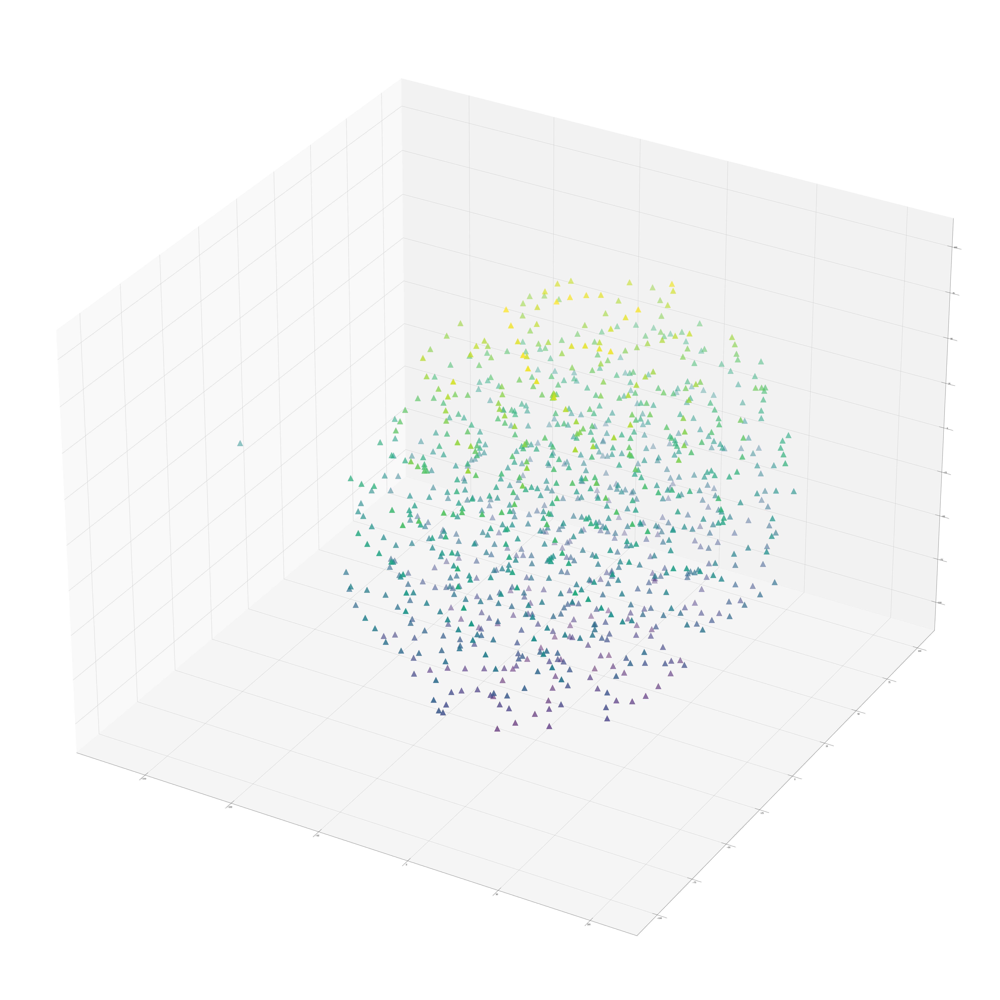

In [28]:
embeddings_tSNE=tsne_3d(model)
plot_tsne_3d(embeddings_tSNE)

In [56]:
OOV_embeddings=get_oov(model)
np.save("dismult 0-999 100d.npy",OOV_embeddings)

ComplEx

In [61]:
#-ComplEx
kg_array = kg_df.to_numpy().astype(str)
model = ComplEx(epochs=300, k=50, verbose=True)
model.fit(kg_array)

Average ComplEx Loss:   0.000410: 100%|██████████| 300/300 [00:24<00:00, 12.11epoch/s]


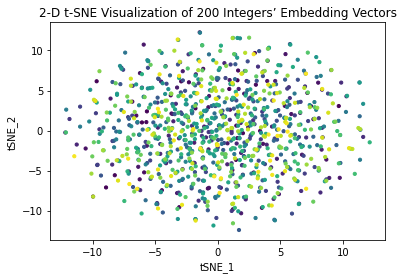

In [30]:
embeddings_tSNE=tsne_2d(model)
plot_tsne_2d(embeddings_tSNE)

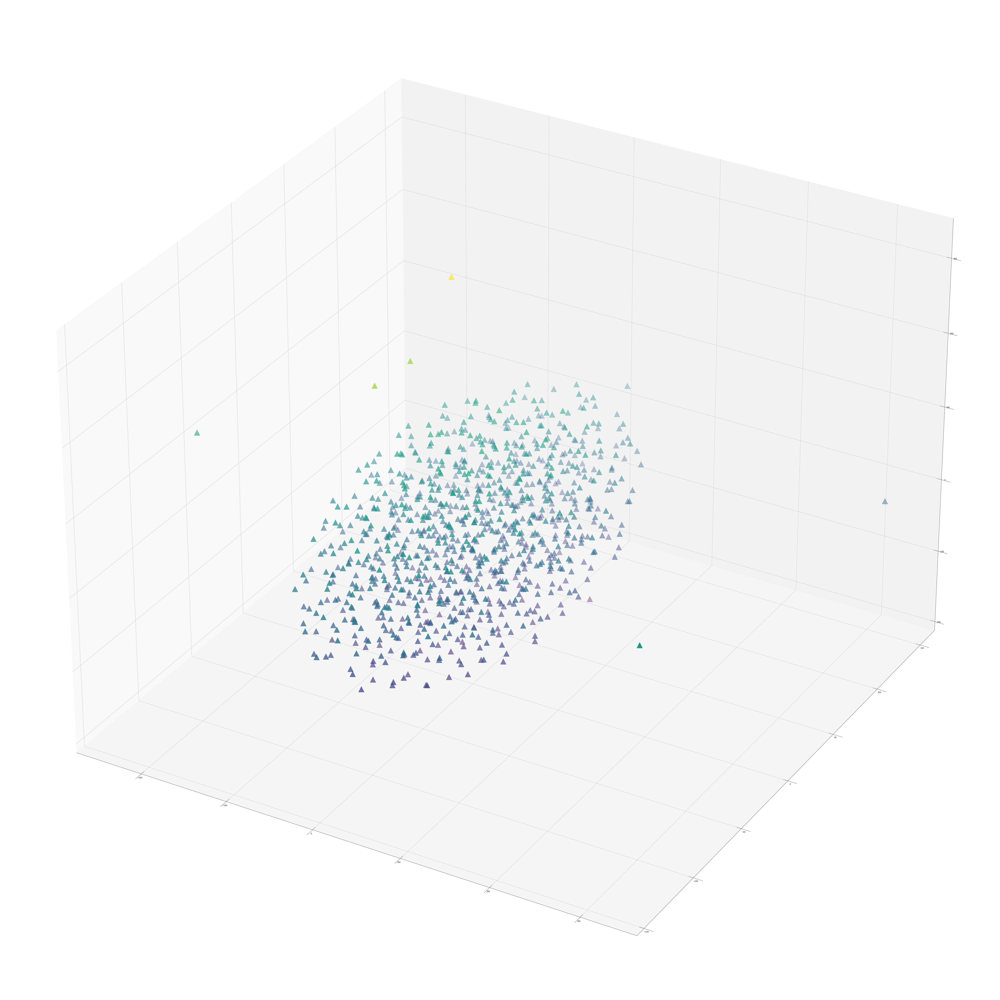

In [31]:
embeddings_tSNE=tsne_3d(model)
plot_tsne_3d(embeddings_tSNE)

In [62]:
OOV_embeddings=get_oov(model)
np.save("complex 0-999 100d.npy",OOV_embeddings)

HolE

In [63]:
#-HolE
kg_array = kg_df.to_numpy().astype(str)
model = HolE(epochs=300, k=50, verbose=True)
model.fit(kg_array)

Average HolE Loss:   0.189663: 100%|██████████| 300/300 [00:25<00:00, 11.70epoch/s]


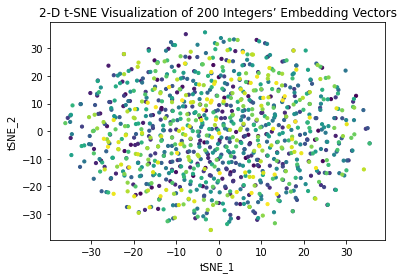

In [33]:
embeddings_tSNE=tsne_2d(model)
plot_tsne_2d(embeddings_tSNE)

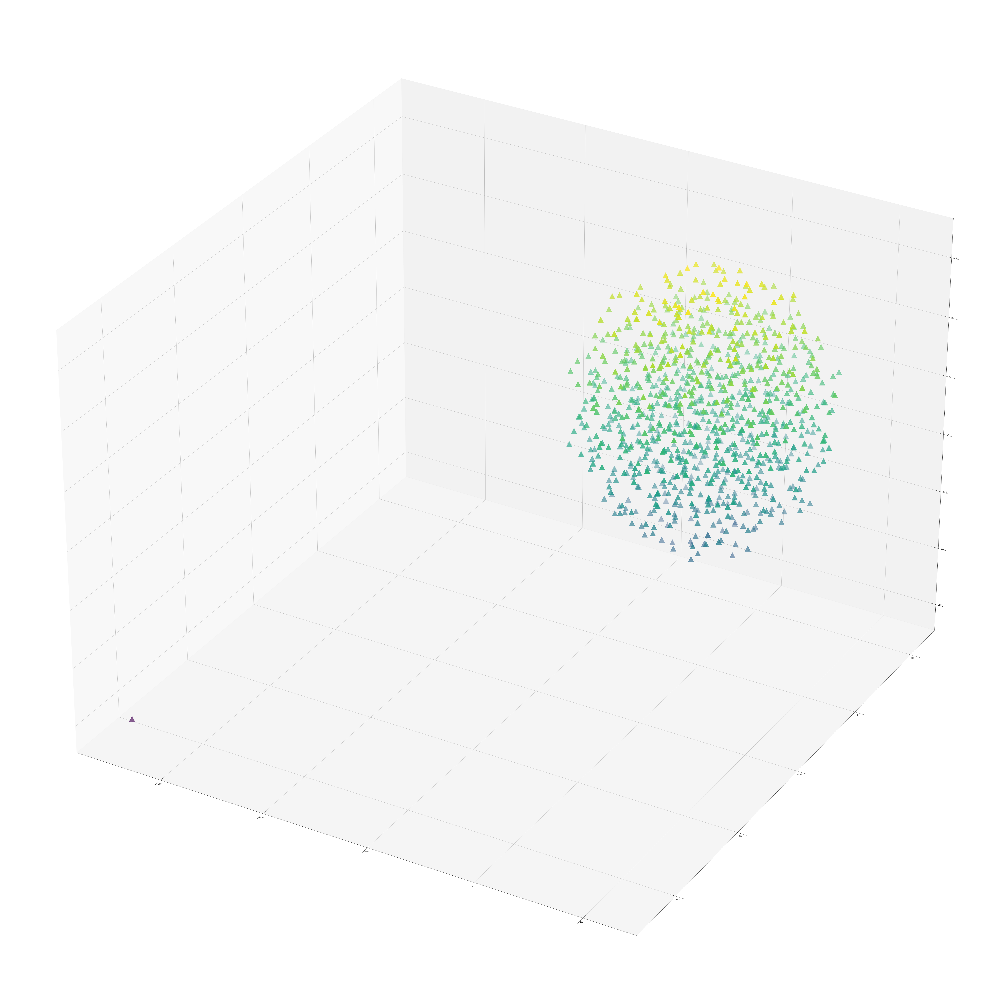

In [34]:
embeddings_tSNE=tsne_3d(model)
plot_tsne_3d(embeddings_tSNE)

In [64]:
OOV_embeddings=get_oov(model)
np.save("hole 0-999 100d.npy",OOV_embeddings)

ConvE

In [69]:
#-ConvE
kg_array = kg_df.to_numpy().astype(str)
model = ConvE(epochs=300, k=100, verbose=True)
model.fit(kg_array)

Average Loss:   1.695440: 100%|██████████| 300/300 [02:01<00:00,  2.47epoch/s]


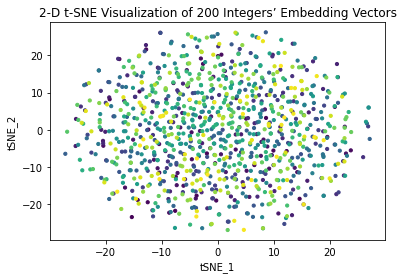

In [70]:
embeddings_tSNE=tsne_2d(model)
plot_tsne_2d(embeddings_tSNE)

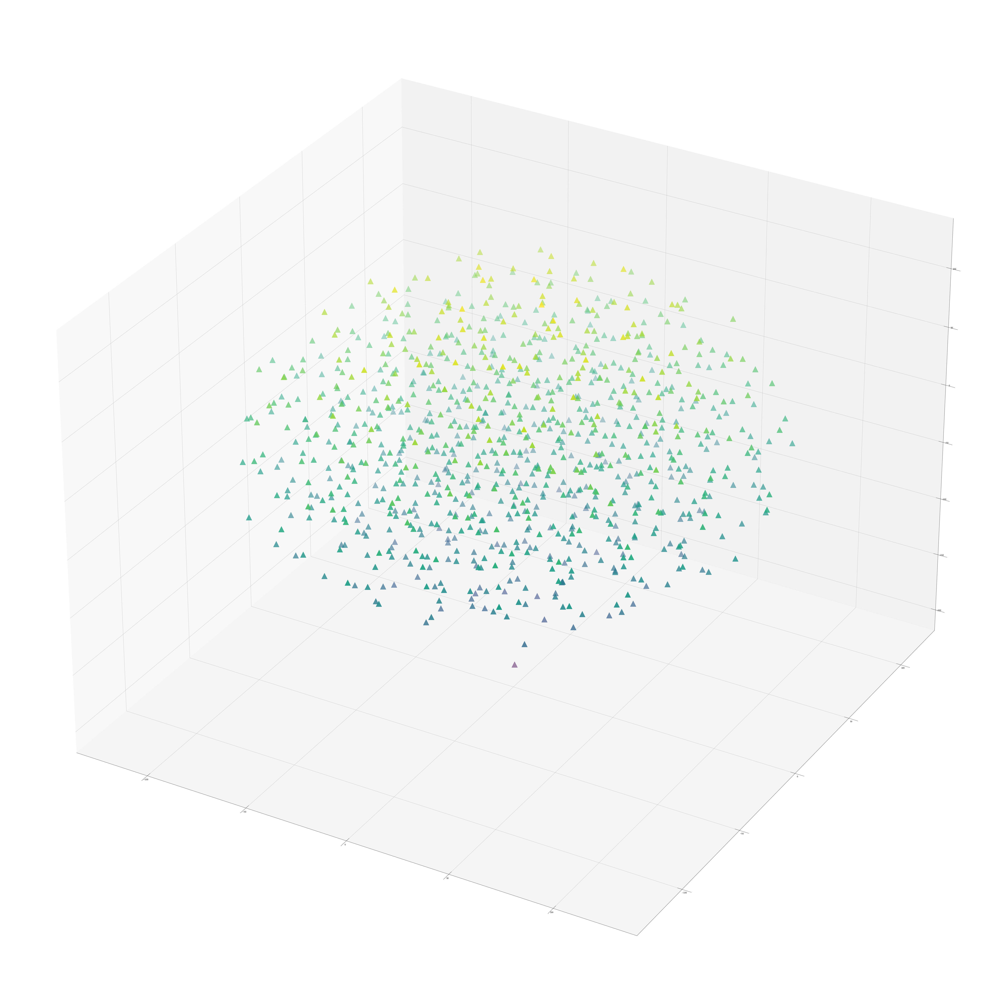

In [71]:
embeddings_tSNE=tsne_3d(model)
plot_tsne_3d(embeddings_tSNE)

In [72]:
OOV_embeddings=get_oov(model)
np.save("conve 0-999 100d.npy",OOV_embeddings)

ConvKB

In [67]:
#-ConvKB
kg_array = kg_df.to_numpy().astype(str)
model = ConvKB(epochs=300, k=100, verbose=True)
model.fit(kg_array)

Average ConvKB Loss:   0.005538: 100%|██████████| 300/300 [00:52<00:00,  5.73epoch/s]


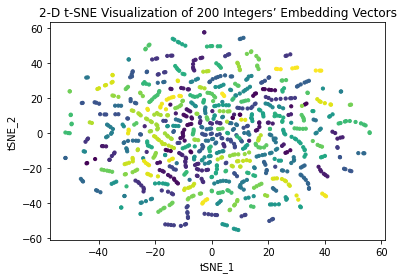

In [39]:
embeddings_tSNE=tsne_2d(model)
plot_tsne_2d(embeddings_tSNE)

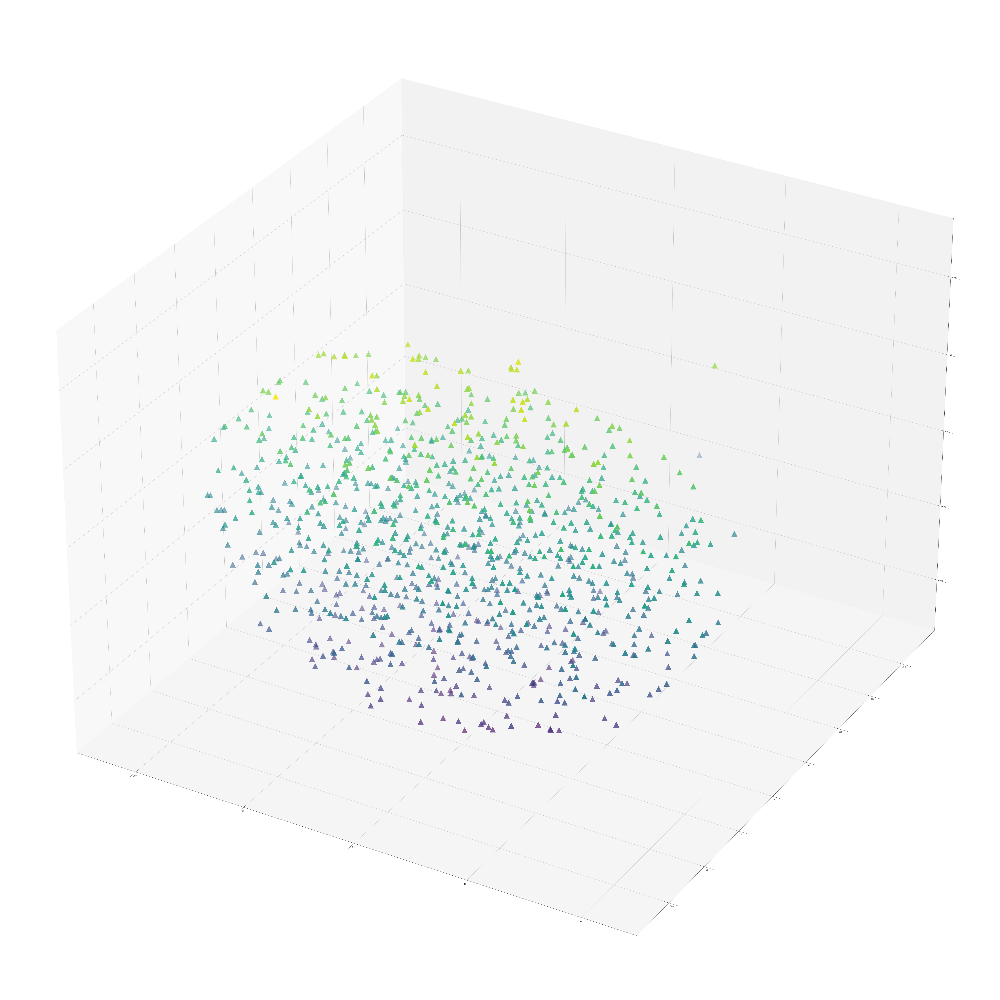

In [40]:
embeddings_tSNE=tsne_3d(model)
plot_tsne_3d(embeddings_tSNE)

In [68]:
OOV_embeddings=get_oov(model)
np.save("conkb 0-999 100d.npy",OOV_embeddings)

2d-tsne-example

In [33]:
# Dimensionality reduction using t-SNE---visualize the embedding
embeddings = model.get_embeddings(entities=[str(j) for j in np.arange(start, stop+1, step)], embedding_type='entity')
embeddings = np.asarray(embeddings, dtype='float64')
embeddings_tSNE = TSNE(n_components=2).fit_transform(embeddings)
embeddings_tSNE = pd.DataFrame(embeddings_tSNE, columns=['tSNE_1', 'tSNE_2'])
embeddings_tSNE['magnitude'] = [i for i in range(start, stop+1, step)]
embeddings_tSNE[:10]

,tSNE_1,tSNE_2,magnitude
0,5.082719,-5.497499,0
1,1.470787,-3.956734,1
2,4.831869,-5.568608,2
3,1.926858,-4.086885,3
4,-17.778229,-13.490634,4
5,2.923610,-3.315433,5
6,-18.445961,-13.853310,6
7,20.309507,54.669533,7
8,-20.270510,15.545601,8
9,20.230438,54.453876,9


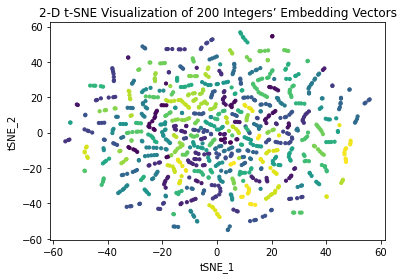

In [34]:
# Visualize the embedding vectors in 2-D space.
plt.scatter(embeddings_tSNE.tSNE_1, embeddings_tSNE.tSNE_2,  c=embeddings_tSNE.magnitude, s=10)
plt.title('2-D t-SNE Visualization of 200 Integers’ Embedding Vectors')
plt.xlabel('tSNE_1')
plt.ylabel('tSNE_2')
plt.show()

3d-tsne-example

In [35]:
# Dimensionality reduction using t-SNE---visualize the embedding
embeddings = model.get_embeddings(entities=[str(j) for j in np.arange(start, stop+1, step)], embedding_type='entity')
embeddings = np.asarray(embeddings, dtype='float64')
embeddings_tSNE = TSNE(n_components=3).fit_transform(embeddings)
embeddings_tSNE = pd.DataFrame(embeddings_tSNE, columns=['tSNE_1', 'tSNE_2', 'tSNE_3'])
embeddings_tSNE['magnitude'] = [i for i in range(start, stop+1, step)]
embeddings_tSNE

,tSNE_1,tSNE_2,tSNE_3,magnitude
0,-24.067339,-32.857735,19.735540,0
1,-62.942570,-13.017096,4.111454,1
2,62.592239,34.116699,-39.020489,2
3,-64.660713,-9.469858,-8.051472,3
4,-88.231873,5.385956,-50.381504,4
...,...,...,...,...
996,-43.085831,4.715450,41.700470,996
997,-27.476904,-1.816983,57.200943,997
998,-35.319489,10.630192,40.847004,998
999,-18.256207,-3.522516,56.482338,999


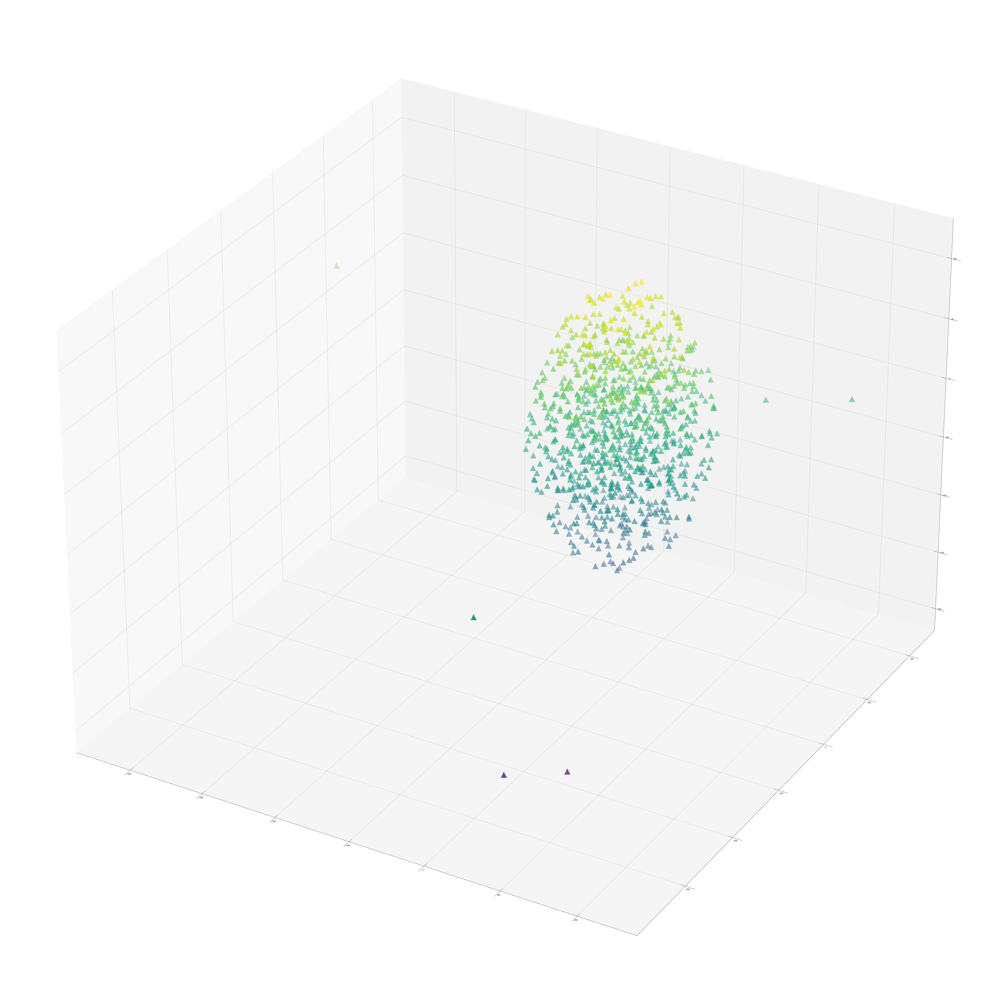

In [43]:
fig = plt.figure(figsize=(100,100))
ax = fig.gca(projection='3d')
x1=embeddings_tSNE.tSNE_1
y1=embeddings_tSNE.tSNE_2
z1=embeddings_tSNE.tSNE_3
#ax.plot(x1, y1, z1)
ax.scatter(x1, y1, z1, c=z1, marker='^',s=1000)
plt.show()

out of vocabulary-example

In [38]:
# Obtain embedding vectors for OOVs.
OOVs = range(0, 1000)
OOV_embeddings = []
for i in OOVs:
    for j in np.arange(start, stop+1, step):
        if i < j:
            upper = j
            lower = j-step
            e1 = model.get_embeddings(str(lower), embedding_type='entity')
            e2 = model.get_embeddings(str(upper), embedding_type='entity')
            s2 = cal_sim(lower, i, upper)
            s1 = 1-s2            
            OOV_embeddings.append(e1 * s1 + e2 * s2)
            break

In [39]:
# Dimensionality reduction using t-SNE.
OOV_embeddings = np.asarray(OOV_embeddings, dtype='float64')
OOV_embeddings_tSNE = TSNE(n_components=2).fit_transform(OOV_embeddings)
OOV_embeddings_tSNE = pd.DataFrame(OOV_embeddings_tSNE, columns=['tSNE_1', 'tSNE_2'])
OOV_embeddings_tSNE['magnitude'] = OOVs
OOV_embeddings_tSNE

,tSNE_1,tSNE_2,magnitude
0,0.521144,4.581515,0
1,4.183255,4.886164,1
2,0.669985,4.570117,2
3,3.925668,5.110109,3
4,1.041956,10.877544,4
...,...,...,...
995,-24.482937,-26.549997,995
996,15.045530,-17.745895,996
997,-24.873905,-25.938101,997
998,15.224822,-17.763393,998


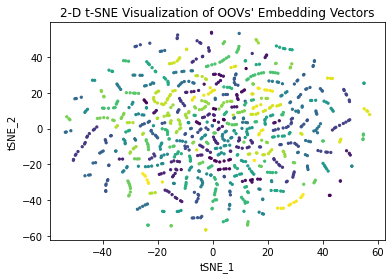

In [40]:
# Visualize the embedding vectors of OOVs in 2-D space.
plt.scatter(OOV_embeddings_tSNE.tSNE_1, OOV_embeddings_tSNE.tSNE_2, c=OOV_embeddings_tSNE.magnitude, s=5)
plt.title('2-D t-SNE Visualization of OOVs\' Embedding Vectors')
plt.xlabel('tSNE_1')
plt.ylabel('tSNE_2')
plt.show()

In [41]:
OOV_embeddings.shape

(1000, 100)

In [42]:
np.save("convkb 0-1000 100d.npy",OOV_embeddings)